# RFV Customer Segmentation (using K-Means and SVM)
### Project Overview
**The Problem:**
* A kitchen brand needs to increase customer recontact to prevent loss or decrease in existing customer base
* Using historical spend data from the last 24 months, we will conduct recency, frequency and value (RFV) analysis
* The aim is to identify different segments of customers (e.g. high frequency, high spend, recent) in order to:
    * Focus on highest recency/frequency/spend (i.e. RFV score) for biggest gains
    * Design custom targetting to each segment based on habits (e.g. lower value products advertised to lower spending customers)

**The Solution/Method:**
* The raw data will be cleaned to neatly group all spend, purchase date and frequency information into 3 variables (recency, frequency and spend)
* **K-Means clustering** will then be used to determine how the customers should be segments based on RFV values
* **Silhouette analysis** will allow us to determine the optimal number of customer segments
* We will then visualize the segments (3D plots of RFV and 2D plots of **manifold TSNE** dimensionality reduction) to help us understand the clusters created and devise names/custom advertising strategies for each of them
* Finally, an **SVM multiclass classifier** model will be trained on existing customer data to allow us to classify customer segments in future on new data (without having to run the clustering process again)

**NOTE:** this first cell (immediately below) prevents the output from going into a condensed scroll box

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

### Input Data
Let's read in the raw data, have an initial look and then determine the pre-processing steps required.

In [2]:
# load libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# read in raw CSV data
data = pd.read_csv('Inputs/raw_data.csv')

# check rows/cols
data.shape

(56697, 53)

In [3]:
# column names
data.columns

Index(['ID', 'Business Partner', 'Business ID', 'Address Line 1',
       'Address Line 2', 'Address Line 3', 'Address Line 4',
       'BAS: Postal Code', 'E-Mail Address', 'Telephone 1', 'Telephone 2',
       'Total Credit Limit', 'Customer Last Trade', 'Account Number',
       'Account Setup Date', 'Home Plant', 'Location', 'Account Types',
       'MA: Contact allowed\Trading Calendar year/month', '0-3 Month Spend',
       '3-6 Month Spend', '6-9 Month Spend', '9-12 Month Spend',
       '12-18 Month Spend', '18-24 Month Spend', '0-3 Month Orders',
       '3-6 Month Orders', '6-9 Month Orders', '9-12 Month Orders',
       '12-18 Month Orders', '18-24 Month Orders', 'Ancillaries - KITCHEN',
       'Appliances - KITCHEN', 'Kitchen Furniture - KITCHEN',
       'Kitchen Installation - KITCHEN', 'Sinks & Taps - KITCHEN',
       'Worktops - KITCHEN', 'Bedroom Sliding Door - JOINERY',
       'Door Frames - JOINERY', 'External Doors - JOINERY',
       'Flooring Packs - JOINERY', 'Glass & Doubl

In [4]:
# distribution of numeric variables
data.describe()

,ID,Business ID,Home Plant,0-3 Month Spend,3-6 Month Spend,6-9 Month Spend,9-12 Month Spend,12-18 Month Spend,18-24 Month Spend,0-3 Month Orders,...,Hardware - JOINERY,Internal Doors - JOINERY,PVCu - JOINERY,Roof Windows - JOINERY,Stairs and Stair Par - JOINERY,Timber & Sheet Mater - JOINERY,Windows - JOINERY,Kitchen Total,Joinery Total,Kitchen Mix
count,56697.000000,5.669700e+04,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,...,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000,56697.000000
mean,28349.000000,2.511295e+07,8218.735436,279.168720,233.640898,314.755207,314.660391,552.428522,689.566484,1.203168,...,127.631388,299.280402,35.503039,58.368785,8.821037,421.745472,35.957701,1158.979288,1225.240933,0.310935
std,16367.158443,4.064616e+07,254.044131,1291.614233,987.313842,1378.198601,1523.058652,1926.452473,2407.936581,3.355933,...,415.975351,1295.863028,569.586158,479.496012,87.815878,1390.869672,467.386725,5241.756999,3376.277002,2.802174
min,1.000000,4.001003e+06,8002.000000,-10087.340000,-6885.740000,-3553.940000,-8029.260000,-11716.800000,-10363.740000,-7.000000,...,-296.000000,-3063.290000,-599.880000,-543.200000,-169.990000,-376.530000,-308.930000,-8087.970000,-3301.790000,-532.777778
25%,14175.000000,4.075321e+06,8058.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.470000,0.000000
50%,28349.000000,4.158915e+06,8129.000000,0.000000,0.000000,0.000000,0.000000,26.640000,48.250000,0.000000,...,16.020000,0.000000,0.000000,0.000000,0.000000,16.040000,0.000000,7.510000,270.320000,0.020609
75%,42523.000000,4.880384e+06,8206.000000,73.500000,63.510000,89.160000,110.690000,340.440000,453.740000,1.000000,...,108.620000,174.340000,0.000000,0.000000,0.000000,271.350000,0.000000,408.090000,1133.780000,0.713131
max,56697.000000,1.045198e+08,8895.000000,98814.360000,51832.300000,128531.450000,199105.530000,172759.810000,207712.490000,146.000000,...,34442.130000,134964.500000,49517.960000,22207.430000,7287.510000,62827.130000,36279.950000,721372.290000,239663.480000,327.086956


In [5]:
# show nulls
null_cols = data.isnull().sum()
null_cols[null_cols > 0]

Address Line 1    47
dtype: int64

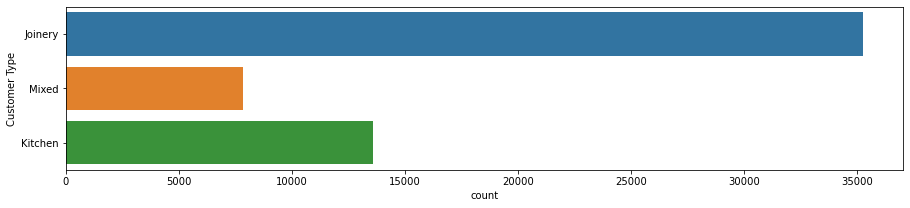

In [6]:
# examine split of customer type (i.e. kitchen, joinery or mixed)
plt.figure(1 , figsize = (15 , 3))
sns.countplot(y = 'Customer Type' , data = data)
plt.show()

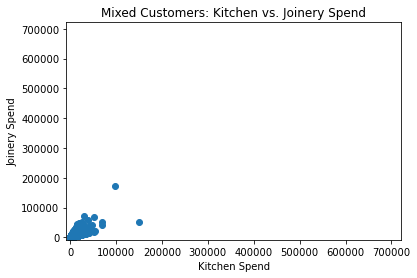

In [7]:
# extract mixed customer type only
mixed = data.loc[data['Customer Type'] == "Mixed"]

# scatter kitchen vs. joinery spend for mixed customers
plt.scatter(mixed['Kitchen Total'], mixed['Joinery Total'])
plt.title("Mixed Customers: Kitchen vs. Joinery Spend")
plt.xlabel("Kitchen Spend")
plt.ylabel("Joinery Spend")
plt.xlim(data['Kitchen Total'].min(), data['Kitchen Total'].max())
plt.ylim(data['Kitchen Total'].min(), data['Kitchen Total'].max())
plt.show()

### Cleaning and Pre-Processing
Steps:
* The above shows us that we have **52 features** in our dataset, containing:
    * ID column (unique 1 per customer)
    * Several customer description fields (e.g. address, phone number, account number...)
    * A "Customer Last Trade" date field recording most recent purchase
    * Spend broken up into 6 columns (1 per period i.e. 0-3 months, 3-6...)
    * Frequency broken up into 6 columns (1 per period also)
    * Further spend columns defined by the type of product purchased (e.g. worktops, sinks, taps...)
    * Customer type columns defining whether or not they are kitchen, joinery or both and the % split of each    
* We can **drop all of the customer descriptive information** (i.e. address, names...) as we're not interested in that for this analysis. The only field we'll keep is ID to enable us to link our results back to our input data later on so that we know which customers belong to which segment
* We will condense both **spend and frequency into single columns** (each) which simply sums their total spend and total number of orders respectively as we're not interested in the split of spend and orders across specific time periods
* We will create a **recency column** based on the "Customer Last Trade" column, simply calculating the number of days since the last purchase (using May 13th 2019 as today's date as this was when the data was recorded)
* **Customer type** needs some consideration:
    * We have ~57,000 customers in total in this dataset
    * Of those, 35,000 are joinery, 13,000 are kitchen and the rest (~9,000 are mixed)
    * We can either process the whole data set as one, determining clusters taking all customers into account
    * Or, we can split our dataset into 3, applying steps to each separately
    * We will proceed with the dataset as a whole and ignore the customer type, we can check later on the proportion of customer types in our final segments and rely on our clustering to identify patterns in spend etc. by itself without this extra field as a guide

In [8]:
# create 'Value' and 'Frequency' columns as sum of 'Spend' and 'Orders' columns respectively
data['Value'] = data.loc[:, '0-3 Month Spend':'18-24 Month Spend'].sum(axis=1)
data['Frequency'] = data.loc[:, '0-3 Month Orders':'18-24 Month Orders'].sum(axis=1)

# convert 'Customer Last Trade' to datetime
data['Customer Last Trade'] = pd.to_datetime(data['Customer Last Trade'], format='%d/%m/%Y')

# define today's date (date of data collection)
import datetime as dt
today = pd.to_datetime({'year':[2019], 'month':[5], 'day':[13]})

# determine 'Recency' column from most recent spend column (number of days)
data['Recency'] = (today[0] - data['Customer Last Trade']).dt.days

# remove now redundant column
del data['Customer Last Trade']

# drop all customer description fields except for index and 'Customer Last Trade'
data = data.drop(data.loc[:, 'Business Partner':'Customer Type'].columns, axis = 1)

# re-order columns to match RFV
data = data[['Recency', 'Frequency', 'Value']]

# peek at clean data
data.describe()

,Recency,Frequency,Value
count,56697.000000,56697.000000,56697.000000
mean,242.867048,11.722860,2384.220221
std,221.404535,25.578397,6835.398782
min,0.000000,-67.000000,-6768.310000
25%,42.000000,1.000000,114.740000
50%,175.000000,3.000000,539.270000
75%,413.000000,11.000000,2226.900000
max,742.000000,833.000000,722085.220000


**Handling Negative Values:**
* Our data looks much better now that we've cleaned and rearranged it
* However we have some negative values in frequency and value
* It's not possible to have negative orders or spend and although this might relate to special cases (e.g. refunds) it's safer for us to drop these rows, particularly as there aren't many of them in our dataset
* Below you can see that we only lose ~800 samples from our total of ~57,000

In [9]:
# drop negative values
data = data[data['Frequency'] >= 0]
data = data[data['Value'] >= 0]

# check data
data.describe()

,Recency,Frequency,Value
count,55848.000000,55848.000000,55848.000000
mean,241.145126,11.914536,2417.037861
std,220.605675,25.722202,6879.386461
min,0.000000,0.000000,0.000000
25%,42.000000,1.000000,123.297500
50%,173.000000,4.000000,559.390000
75%,411.000000,11.000000,2269.055000
max,742.000000,833.000000,722085.220000


### Investigate Clean Data
**Notes:**
* You can see below that our recency data is fairly well distributed, with the majority of data being more recent (within the last ~6 months) with a lower but fairly steady distribution back to 2 years before the date of collection
* Frequency and value are both very spread out, with large scale ranges and a high concentration of values towards the lower end of each
* For example, the majority of customers make a handful of purchases (between 0 and 5) but there are lots of outliers with higher frequencies up to >800 within the last 2 years
* Similarly, the majority of customers spend a small amount (only a few hundred pounds) but there are many cases of higher values with a few extreme outliers up at around £700,000 at the top end

**Outliers:**
* Outliers can either be **errors** (measurement error, data entry error etc.) or **real** (i.e. real data, just an extreme value)
* For ML models they raise issues because they can **increase processing time, reduce accuracy and generally destabilize** model building due to affecting the range, variance etc. which ML algorithms are sensitive to
* For general analysis they are a problem because they can **reduce the value and impact** of the rest of your data which might be where the key patterns and distributions lie
* Outliers affect your data more if they occur as **more extreme values** (i.e. further from your mean) or if they occur in a **small overall sample** (i.e. 1 point has more impact in a sample of 10 vs. a sample of 10,000)
* As such, we must deal with our outliers and we will look at this below

**Frequency and Value:**
* The first thing to check is whether or not these seeming outliers are **real or errors**
* Investigating the raw data shows that the customers responsible for the higher value results tend to be multiple large purchases for farms, industrial estates, entire apartment blocks etc. and therefore appear genuine rather than anomalies due to data entry errors etc.
* The highest frequency customers also appear to be real, being tied in many cases to those same larger value purchases mentioned above (i.e. where lots of items are required to fit a big building/site
* If the outliers had have been errors, we could have dropped them entirely from our dataset. However, being real we must decide how to handle these properly. We have some options:
    * **Reduce extreme outliers** in-line with other high values if pattern/behaviour isn't drastically different
    * **Group data** into bins (i.e. bin 1 = 0-50, ..., bin 10 = 10,000+) to reduce effect of extreme outliers
    * Detect and **eliminate outliers with statistical methods** (e.g. Z-score, interquartile range (IQR))
    * Do nothing, **retain outliers** due to their value as genuine data
    
**Further Reading:**
* [Outlier Detection Methods](https://towardsdatascience.com/a-brief-overview-of-outlier-detection-techniques-1e0b2c19e561)
* [Outliers in ML](https://datascience.foundation/sciencewhitepaper/knowing-all-about-outliers-in-machine-learning#:~:text=Machine%20learning%20algorithms%20are%20sensitive,models%20and%20ultimately%20poorer%20results.)

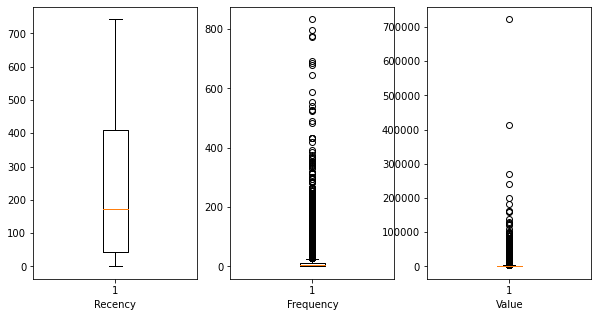

In [10]:
fig, axs = plt.subplots(1, 3, figsize=(10,5))
axs[0].boxplot(data['Recency']); # semi-colon to hide plot notes/description
axs[0].set_xlabel('Recency');
axs[1].boxplot(data['Frequency']);
axs[1].set_xlabel('Frequency');
axs[2].boxplot(data['Value']);
axs[2].set_xlabel('Value');

### Handling Outliers (Frequency and Value)
**Methods to Identify Outliers:**
* Interquartile Range (IQR)
    * IQR = Q3 - Q1
    * Outliers = (Q3 + 1.5 * IQR) and (Q1 - 1.5 * IQR)
* Skewness
    * Data is generally normally distributed
    * Skewness should range between -1 and 1 for a normal distribution
    * Skewness will be < -1 or > 1 for data containing outliers
* Boxplots (or other visuals e.g. histogram, scatter)
    * Outliers appear outside of box
    * General visual appearance of data will show clear outliers
    
**Methods to Handle Outliers (once identified):**
* Quantile Flooring & Capping
    * Remove values <10% or >90% percentile of data
* Trimming
    * Sort data by variable of interest
    * Drop all rows above/below a specific threshold
* IQR
    * Drop anything > Q3 + 1.5 * IQR
    * or < Q1 - 1.5 * IQR
* Log Transform
    * Convert data into logarithmic scale
    * This will dampen the effect of outliers (check skewness before/after for confirmation)
* Replace Outliers
    * Replace outliers with median value
    * Don't replace with the mean as this is more affected by the outliers themselves

**Further Reading:**
* [Removing Outliers](https://www.pluralsight.com/guides/cleaning-up-data-from-outliers)

**Steps:**
* We will use the **IQR method** (above) to remove all outliers from both ends of our dataset
* Whilst we will lose some data, this will purely be from the extreme high end of frequency and spend
* We can use our model (once this project is complete) to predict categories for these excluded samples to just check that our model handles them sensibly (i.e. putting them into high spend, high frequency groups) and this can be an additional validation step for our project

**Outliers as Their Own Cluster:**
Notes:
* Outliers are defined as statistically extreme values on a scale (often identified by a threshold limit which they exceed e.g. 1.5 * IQR or 3 times the standard deviation from the mean)
* However, choosing to exclude or retain them depends on their relevance to your problem/solution
* For example, if you were trying to find the average salary in the UK, you would want to include the upper and lower extremes because they are relevant to the average and your results would not be correct if you excluded them
* In this case, because our outliers are towards the high end of spend/frequency, they are important to the client because they make up a significant amount of the overall customer spend
* However, their data is so different to the other customers (who are mostly low spend, low frequency) that keeping them in for the clustering and SVM stages would decrease the accuracy of those models
* As such, we will split out our outliers here (using IQR) and simply store them in a cluster of their own (along the lines of "big spenders" as they can be treated distinctly without complex clustering that will be performed in later stages here)

In [11]:
# calculate quartiles
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)

# calculate IQR
IQR = Q3 - Q1

# check IQR for each var
print(IQR)

Recency       369.0000
Frequency      10.0000
Value        2145.7575
dtype: float64


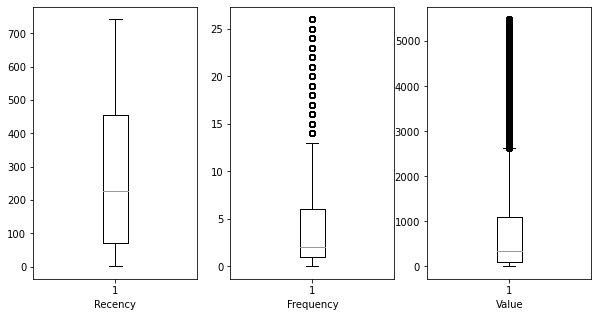

In [12]:
# extract outliers into their own cluster
outliers = data[((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).any(axis=1)]

# drop data under lower and upper outlier range
data = data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).any(axis=1)]

# check new boxplots with outliers removed
fig, axs = plt.subplots(1, 3, figsize=(10,5))
axs[0].boxplot(data['Recency']); # semi-colon to hide plot notes/description
axs[0].set_xlabel('Recency');
axs[1].boxplot(data['Frequency']);
axs[1].set_xlabel('Frequency');
axs[2].boxplot(data['Value']);
axs[2].set_xlabel('Value');

**Outliers Removed:**
* You can now see in the above boxplots that the distribution of Frequency and Value is a lot more sensible and easier to interpret
* This should negatively affect our model, clustering etc. far less
* The histograms below are an alternate way to view the same information, clearly showing an improved distribution of data
* It's clear that most customers make few orders (0-5) with low value (0-500) with fewer individuals making bespoke, high value, high frequency orders

<AxesSubplot:xlabel='Value', ylabel='Count'>

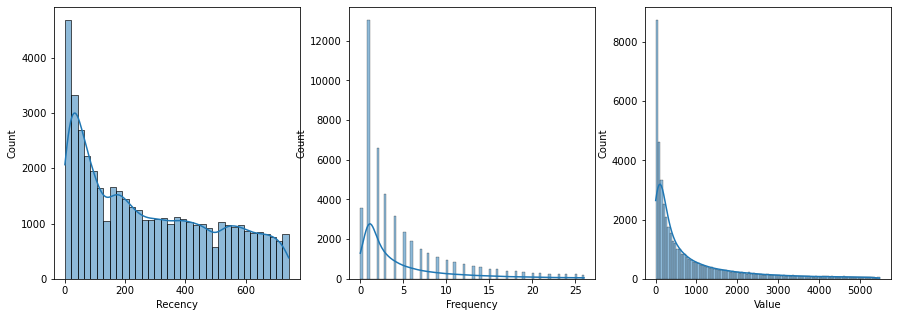

In [13]:
fig, axs = plt.subplots(ncols=3, figsize=(15, 5))
sns.histplot(data=data, x='Recency', kde=True, ax=axs[0])
sns.histplot(data=data, x='Frequency', kde=True, ax=axs[1])
sns.histplot(data=data, x='Value', kde=True, ax=axs[2])

### Final Visuals Before Clustering
**Notes:**
* Value appears to be fairly consistent regardles of recency, suggesting that value of materials and sales don't fluctuate massively over time
* The same is true and almost identically distributed for frequency and recency (i.e. number of orders are stable over time)
* The vast majority of customers make a few orders (0-5) resulting in a low spend (0-500). This could either be because most orders are low value, or because the value of orders is directly proportional to number of orders (i.e. the more things you buy, the more expensive) or a combination of both

**Further Reading:**
* [Seaborn Pair Plots](https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166)
* [Seaborn Pair Grids](https://seaborn.pydata.org/generated/seaborn.PairGrid.html)
* [Multivariate Plotting](https://www.kaggle.com/residentmario/multivariate-plotting)

**NOTE:** the below code is computationally expensive and slow, only run if you have to!

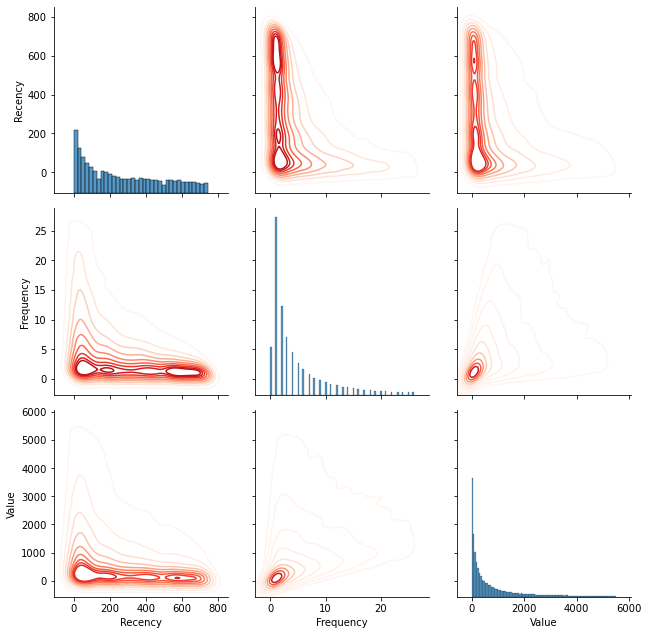

In [14]:
# create grid framework to show all combos of variables
grid = sns.PairGrid(data = data, vars = ['Recency', 'Frequency', 'Value'], height = 3)

# make diagonals histograms (i.e. var vs. itself)
grid = grid.map_diag(sns.histplot)

# make everything else a density/contour plot
grid = grid.map_offdiag(sns.kdeplot, cmap = 'Reds')

### K-Means Clustering
**Notes:**
* K-Means clustering is an **unsupervised** learning method of grouping data
* It randomly drops **centroids** (which are just data points) into the distribution and then assigns data points from your set to their nearest centroid to determine clusters
* The initial centroids are random, it then optimizes the centroid position by iteratively reducing the **sum of squares** (i.e. size of clusters/average distance between points in a cluster and the centroid itself
* It is called **K-Means** because it aims to reduce the mean of the distance between points and their centroid
* The process repeats until the cluster sizes stabilize/stop changing or until a maximum number of iterations are reached
* The **number of clusters (n_clusters)** determines how many clusters the algorithm will split your data into
* You can experiment with n_clusters and assess model accuracy to see which number is best
    * This can be measured using **silhouette analysis**
    * This is where you score each data point (1 if the centroid it's assigned to is it's closest of all centroids, 0 if it's equidistant to another centroid(s) or -1 if another centroid is closer than it's assigned one)
    * You then average the scores across your dataset for an overall score
    * The closer this score is to 1, the better your clustering was for separating clusters effectively
    * [Silhouette Analysis for Selecting n_clusters](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)
* K-Means is unsupervised because it determines the clusters by itself without learning pre-defined labels
* It is a quick and effective method of clustering data but it can vary quite significantly (i.e. definition of clusters) with changes to the input data. There are more sophisticated clustering methods out there which are more reliable but they come at the cost of greater complexity and longer learning time. For the purposes of our data, K-Means will suffice.

**Further Reading:**
* [K-Means Clustering in ML](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1)

### Clustering Our Data
**Steps:**
* Check variables for correlation, if there is high correlation then there might be underlying patterns which we need to account for
* **Standardize** our data (std = 1, mean = 0 to allow our algorithm to handle data without giving unnecessary weighting to e.g. higher values in one var due to different scales etc.)
* **Silhouette analysis** of various n_clusters
* Select best n_clusters and run K-Means to split our data

In [15]:
# check correlation of variables
# reasonable link between frequency and recency
# and between frequency and value
# but nothing that suggests direct link, so we can proceed
data.corr()

,Recency,Frequency,Value
Recency,1.000000,-0.412781,-0.272040
Frequency,-0.412781,1.000000,0.497033
Value,-0.272040,0.497033,1.000000


In [16]:
# load libraries
from sklearn.preprocessing import StandardScaler

# extract features as numpy array
X = data[['Recency', 'Frequency', 'Value']].to_numpy()

# scale features
scaler = StandardScaler()
X_sc = scaler.fit_transform(X)

# check output shape
X_sc.shape

(46270, 3)

**A note on K-Means Clustering:**
* K-Means can be **slow on large datasets** and particularly when repeating multiple times (i.e. below where we're testing different values of n_clusters
* As such, you can use **batch clustering** (links below) which is faster but less reproducible/more varied
* Links:
    * [SKLearn Docs](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MiniBatchKMeans.html#sklearn.cluster.MiniBatchKMeans)
    * [Stack Overflow](https://stackoverflow.com/questions/46515481/how-to-speed-up-k-means-from-scikit-learn)
    
**Silhouette Analysis:**
* [Silhouette Score Explained](https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam#:~:text=The%20value%20of%202%20and,is%20above%20average%20silhouette%20scores.)
* [Plotting Silhouette Results](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)

For 2 the silhouette score is 0.4545776022885846.
For 3 the silhouette score is 0.4133648568171647.
For 4 the silhouette score is 0.4378287744616189.
For 5 the silhouette score is 0.40693859977048746.
For 6 the silhouette score is 0.3596926313767071.
For 7 the silhouette score is 0.3583812390451479.
For 8 the silhouette score is 0.3643539610570333.
For 9 the silhouette score is 0.37517312902034994.
For 10 the silhouette score is 0.3591912787369037.
For 11 the silhouette score is 0.3588414376902761.


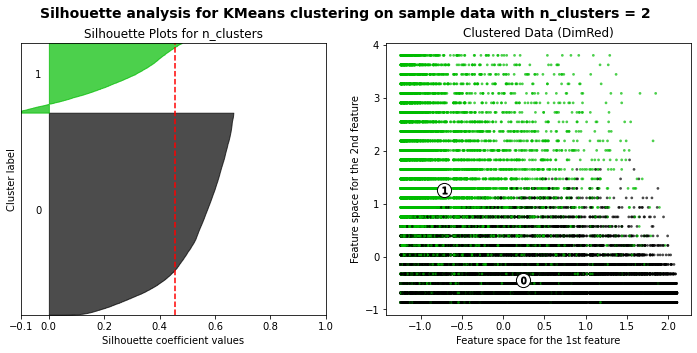

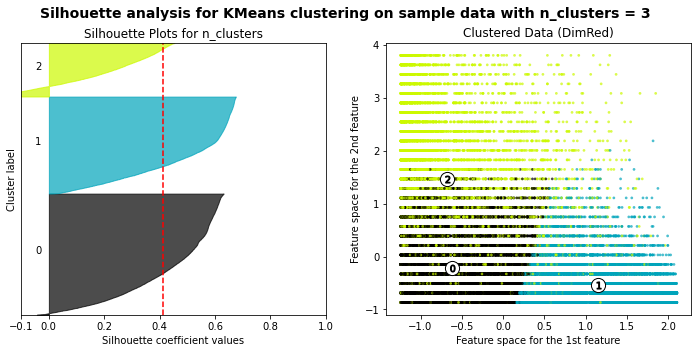

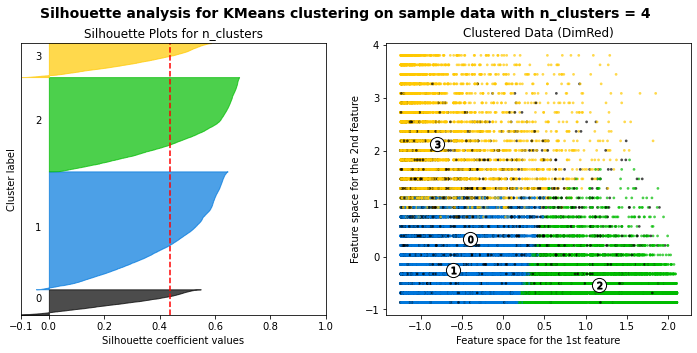

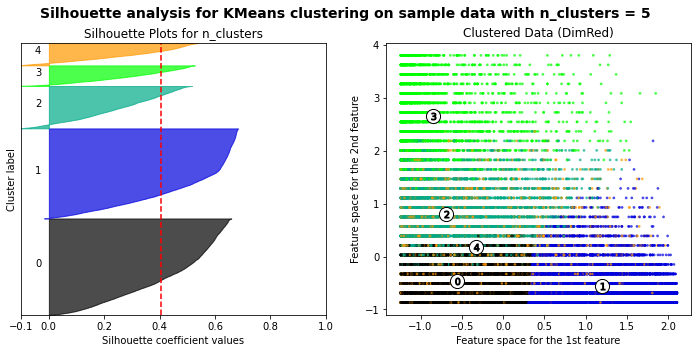

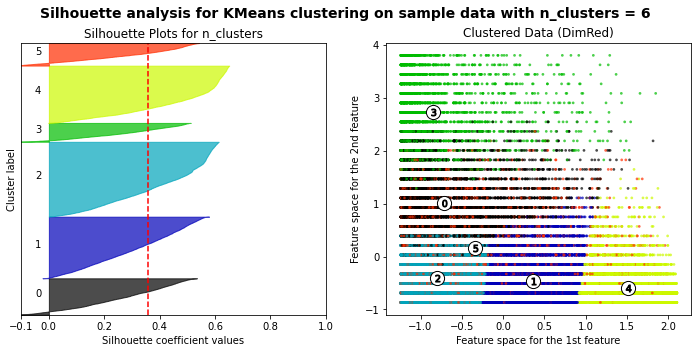

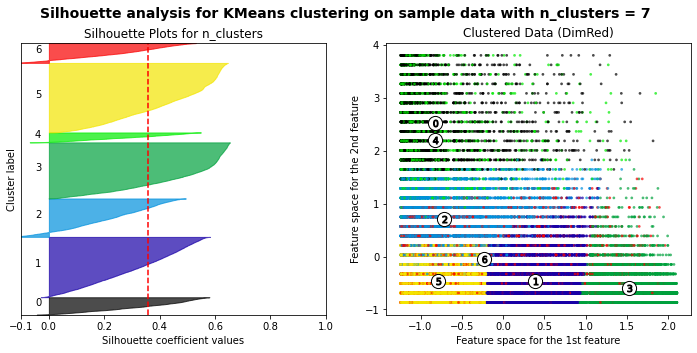

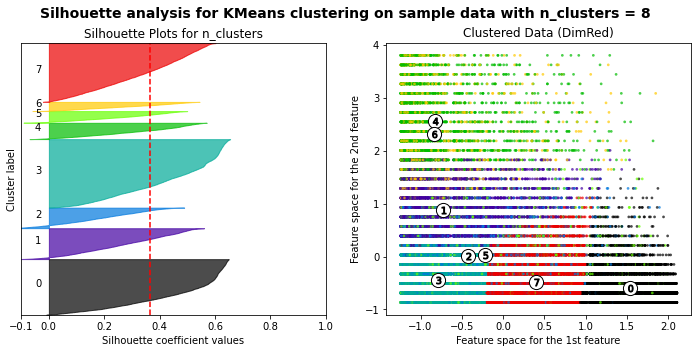

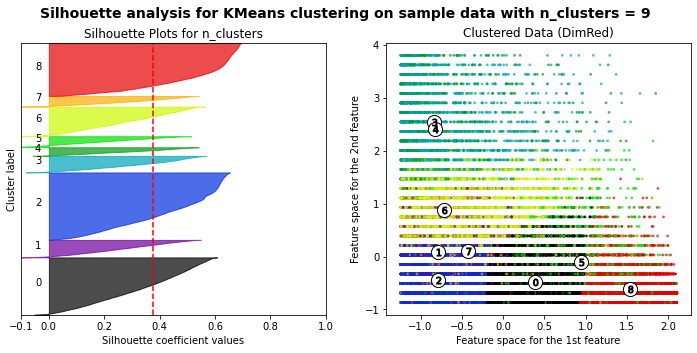

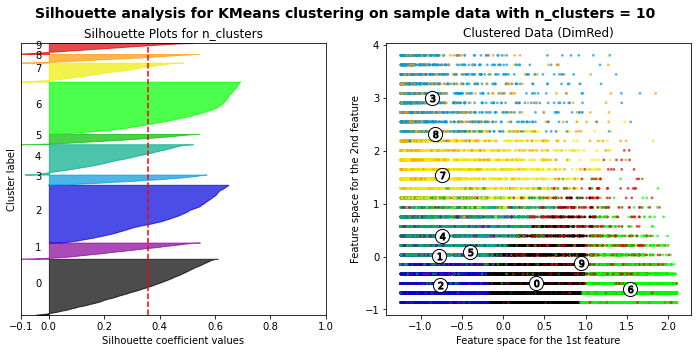

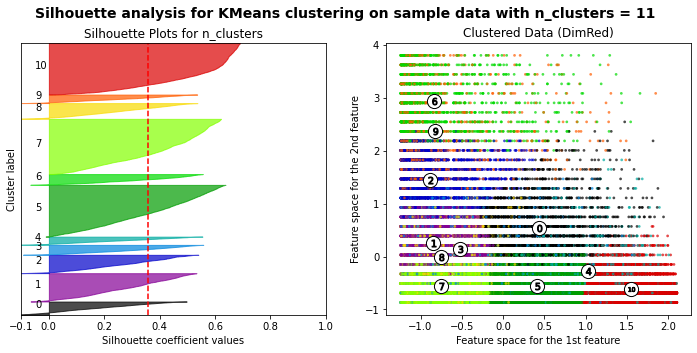

In [17]:
# load libraries
from matplotlib import cm
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

# range of clusters to try
range_n_clusters = list(range(2, 12))

for n_clusters in range_n_clusters:
    # create 1x2 subplot per cluster
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 5)

    ### 1) SILHOUETTE PLOT ###
    # 1st subplot is silhouette plot
    # silhouette coefficient can range from -1, 1 but here min is -0.1
    ax1.set_xlim([-0.1, 1])
    
    # insert blank space above upper limit of y to clearly separate plots
    ax1.set_ylim([0, len(X_sc) + (n_clusters + 1) * 10])

    # initiate model with n_clusters and n_init (attempts n different seed positions for centroids)
    clusterer = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=300)
    cluster_labels = clusterer.fit_predict(X_sc) # fit model to data and predict clusters

    # return silhouette score for this iteration of n_clusters (X and y_pred as inputs)
    silhouette_avg = silhouette_score(X_sc, cluster_labels)
    print(f'For {n_clusters} the silhouette score is {silhouette_avg}.')

    # calculate silhouette scores for each cluster/sample (X and y_pred as inputs)
    # returns score per cluster
    sample_silhouette_values = silhouette_samples(X_sc, cluster_labels)

    # buffer value for y-axis in cluster scores
    y_lower = 10
    
    # iterate through n_clusters
    for i in range(n_clusters):
        # sort cluster scores
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        # get number of data points per cluster
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        
        # add buffer to y-axis for cluster values
        y_upper = y_lower + size_cluster_i

        # calculate custom colour based on cluster number
        color = cm.nipy_spectral(float(i) / n_clusters)
        
        # fill space between clusters
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # label plots with cluster numbers (in middle of axis)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # calculate lower bound for next plot (increment from existing)
        y_lower = y_upper + 10  # 10 for the 0 samples

    # plot labels
    ax1.set_title("Silhouette Plots for n_clusters")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # plot vertical line for average silhouette score of plot
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    # clear y axis and set x ticks
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ### 2) 2D REDUCED DIMENSION PLOT ###
    # second plot showing clusters in reduced dimensional feature space (i.e. 3D in 2D)
    # custom colour based on cluster number
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    
    # scatter plot of first variable
    ax2.scatter(X_sc[:, 0], X_sc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # label clusters with calculated cluster centre names/coordinates (extract x and y coords)
    centers = clusterer.cluster_centers_
    
    # mark centroids with white circles
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    # iterate through centroids
    for i, c in enumerate(centers):
        # scatter plot and mark
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')
        
    # label plots
    ax2.set_title("Clustered Data (DimRed)")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    # title everything
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

# show final polot
plt.show()

### Interpreting and Visualizing the Clusters
**Selecting n_clusters:**
* When selecting clusters, you want a high average silhouette score (red dotted line), all cluster regions to peak above the dotted line and as much consistency between thickness of cluster regions as possible
* The 2 main contenders from the above analysis appear to be 2 and 4
* 2 has the highest score but the cluster size is significantly different and 2 clusters is not enough for the analysis we're after (i.e. we want to split our customers into smaller, distinct groups
* As such, **we will select 4 clusters** for our final analysis

In [18]:
# K-Means with 4 clusters
# tolerance ensures better convergance of final clusters
# elkan alg. is more memory intensive but better for well defined clusters
# now that we've selected n_clusters we can specify these parameters for a more tuned model
kmeans=KMeans(n_clusters = 4, init='k-means++', n_init = 10,
              max_iter=300, tol=0.0001, algorithm='elkan')

# fit model to data
kmeans.fit(X_sc)

# predict clusters
clusters = kmeans.predict(X_sc)

# add clusters to original df
data['Cluster'] = clusters

# check new data
data.head()

,Recency,Frequency,Value,Cluster
0,39,3,1727.52,1
1,304,6,689.41,1
2,166,1,167.99,1
3,600,1,83.10,0
4,146,3,92.69,1


**Visualizing Our Clusters:**
* Our data is 3-dimensional (R, F & V) therefore we can create a 3D plot of our clustered data
* This should help us visualize exactly what each cluster means (i.e. where along each of the 3-axes customers fall)
* [Plotly 3D Scatter Plots](https://rodrigodutcosky.medium.com/creating-a-3d-scatter-plot-from-your-clustered-data-with-plotly-843c20b78799)
* [Cluster Visualization in Plotly](https://www.kaggle.com/naren3256/kmeans-clustering-and-cluster-visualization-in-3d)

In [19]:
# load libraries
import plotly.graph_objs as go
import plotly as py

# create 3D scatter plot
cluster_3D = go.Scatter3d(x = data['Recency'],
                          y = data['Frequency'],
                          z = data['Value'],
                          mode = 'markers',
                          marker = dict(color = data['Cluster'], 
                                        size = 20,
                                        line = dict(color = data['Cluster'], width= 12),
                                        opacity = 0.8))

chart_3D = [cluster_3D]
layout = go.Layout(title = '3D RFV Clusters',
                   scene = dict(xaxis = dict(title  = 'Recency'),
                                yaxis = dict(title  = 'Frequency'),
                                zaxis = dict(title  = 'Value')))

# create figure
fig = go.Figure(data=chart_3D, layout=layout)

# plot chart
py.offline.iplot(fig)

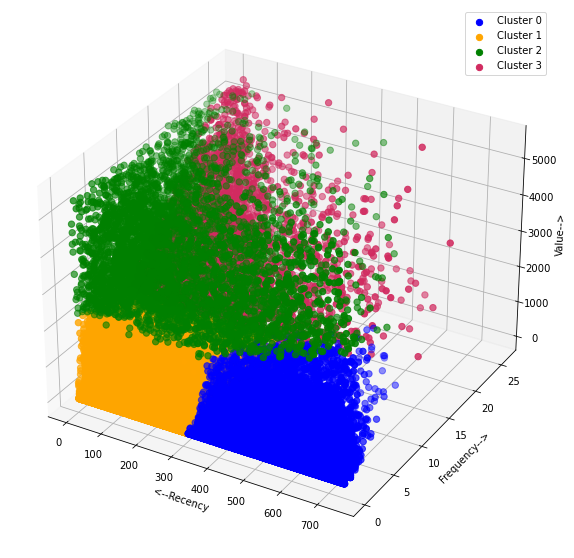

In [20]:
# matplotlib scatter plot (same as above except with cluster labels)
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(111, projection='3d')

# define axes (use non-scaled data for raw axis lables)
# extracts X, Y and Z values (i.e. R, F and V) from features, splitting them by cluster label
ax.scatter(X[clusters == 0,0], X[clusters == 0,1], X[clusters == 0,2], s = 40 , color = 'blue', label = "Cluster 0")
ax.scatter(X[clusters == 1,0], X[clusters == 1,1], X[clusters == 1,2], s = 40 , color = 'orange', label = "Cluster 1")
ax.scatter(X[clusters == 2,0], X[clusters == 2,1], X[clusters == 2,2], s = 40 , color = 'green', label = "Cluster 2")
ax.scatter(X[clusters == 3,0], X[clusters == 3,1], X[clusters == 3,2], s = 40 , color = '#D12B60', label = "Cluster 3")

# axis labels
ax.set_xlabel('<--Recency')
ax.set_ylabel('Frequency-->')
ax.set_zlabel('Value-->')

# add legend
ax.legend()

# plot data
plt.show()

**3D Cluster Analysis:**
* Firsly we can see that our **clusters aren't perfectly separable**
* There is clearly **some overlap**, showing that our customers are more of a continuous scale rather than clearly defined groups
* Our clusters have been split as such:
    * Cluster 0 = Low frequency, low spend but recent
    * Cluster 1 = Low frequency, low spend and long ago
    * Cluster 2 = High frequency, high recency and mixed spend (high and low)
    * Cluster 3 = Low frequency, high recency and high spend
* As such, we could label our clusters as follows:
    * **Cluster 0 = Fresh Prospects**
    * **Cluster 1 = Distant Specs**
    * **Cluster 2 = Core Consumers**
    * **Cluster 3 = Sporadic Spenders**
* Now that we have our clusters clearly defined in 3D space, let's have a quick look at them in 2D for a more simplistic, stripped back view.

**Manifold Learning (TSNE):**
* High dimensional data (i.e. anything above 3D) is difficult to visualize for humans
* As such, **dimensionality reduction** can be used to map high dimensional data into lower dimensions (i.e. 2D, 3D) in order for us to see an abstracted view of our data
* This is useful for clustering because it might be impossible to visualize clusters in 4D or higher, but stripping back to 2D makes it possible for us to interpret the clusters in some sense
* Linear dimensionality reduction methods exist, such as PCA, linear discriminant analysis etc. but these **struggle with non-linear data** (such as ours here)
* As such, **non-linear methods** exist which are called **manifold learning** models
* There are many options, but here we will use TSNE (t-distributed stochastic neighbour embedding) because we have a low number of features (3) and a low sample size (~50,000) whereas it would struggle for larger datasets
* TSNE essentially looks for similarities between data points in higher dimensional space and maps them down into a lower dimension based on their calculated proximity
* [SKLearn TSNE Docs](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)
* [SKLearn Manifold Learning (Model Types)](https://scikit-learn.org/stable/modules/manifold.html)
* [Speeding up TSNE for Big Data](https://github.com/DmitryUlyanov/Multicore-TSNE)

Text(0.5, 1.0, '3D Clusters in 2D Dimensional Space (DimRed using TSNE)')

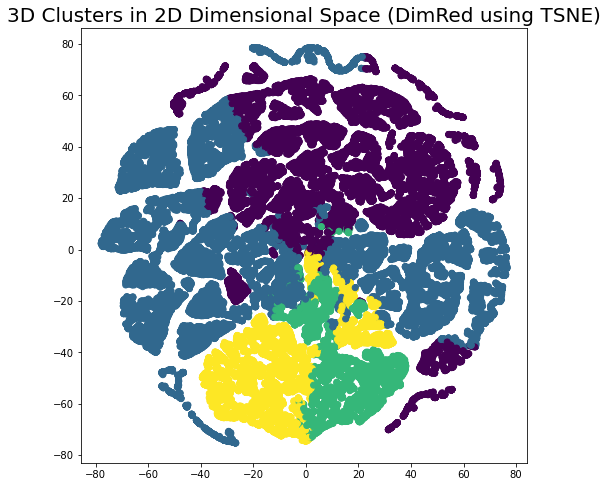

In [21]:
# load libraries
from sklearn.manifold import TSNE

# create TSNE object/model
tsne = TSNE(n_components=2)

# fit model to data and transform (reduce dimensions)
proj = tsne.fit_transform(X_sc)

# create figure and plot as scatter
plt.figure(figsize=(8, 8))
plt.scatter(proj[:,0], proj[:,1], c=clusters)
plt.title("3D Clusters in 2D Dimensional Space (DimRed using TSNE)", fontsize="20")

**Cluster 0: Fresh Prospects**
* Relatively recent (mean of ~5 months old)
* Low frequency (mean of 3.4 total orders)
* Low spend (a few hundred)

In [22]:
# extract and examine cluster 0
cluster_0 = data[data['Cluster']==0]
cluster_0.describe()

,Recency,Frequency,Value,Cluster
count,16074.000000,16074.000000,16074.000000,16074.0
mean,532.752146,1.821078,300.893354,0.0
std,116.892596,1.808154,446.202521,0.0
min,315.000000,0.000000,0.000000,0.0
25%,430.000000,1.000000,35.000000,0.0
50%,535.000000,1.000000,123.100000,0.0
75%,630.000000,2.000000,352.870000,0.0
max,742.000000,15.000000,3141.740000,0.0


**Cluster 1: Distant Specs**
* Quite old (mean of ~1.5 years old)
* Very low frequency (mean of 1.8 total orders)
* Very low spend (a few hundred)

In [23]:
# extract and examine cluster 1
cluster_1 = data[data['Cluster']==1]
cluster_1.describe()

,Recency,Frequency,Value,Cluster
count,20084.000000,20084.000000,20084.000000,20084.0
mean,141.440599,3.403953,452.801854,1.0
std,100.106302,2.700356,471.351139,0.0
min,1.000000,0.000000,0.000000,1.0
25%,51.000000,1.000000,97.822500,1.0
50%,125.000000,3.000000,283.675000,1.0
75%,222.000000,5.000000,652.090000,1.0
max,390.000000,12.000000,2207.000000,1.0


**Cluster 2: Core Consumers**
* Very recent (mean of ~3 months old)
* Moderate frequency (mean of ~17 total orders)
* Low to moderate spend (a few thousand)

In [24]:
# extract and examine cluster 2
cluster_2 = data[data['Cluster']==2]
cluster_2.describe()

,Recency,Frequency,Value,Cluster
count,4321.000000,4321.000000,4321.000000,4321.0
mean,188.641981,6.673455,3529.162698,2.0
std,173.487596,4.616803,985.347143,0.0
min,1.000000,0.000000,1776.920000,2.0
25%,42.000000,3.000000,2666.050000,2.0
50%,138.000000,6.000000,3431.920000,2.0
75%,301.000000,9.000000,4330.480000,2.0
max,740.000000,24.000000,5487.070000,2.0


**Cluster 3: Sporadic Spenders**
* Relatively recent (mean of ~6 months old)
* Low to moderate frequency (mean of 6.6 total orders)
* Moderate spend (a few thousand)

In [25]:
# extract and examine cluster 3
cluster_3 = data[data['Cluster']==3]
cluster_3.describe()

,Recency,Frequency,Value,Cluster
count,5791.000000,5791.000000,5791.000000,5791.0
mean,98.929373,16.692108,1680.896481,3.0
std,113.427125,4.635376,973.890590,0.0
min,2.000000,8.000000,75.450000,3.0
25%,19.000000,13.000000,938.050000,3.0
50%,54.000000,16.000000,1463.180000,3.0
75%,143.000000,20.000000,2186.050000,3.0
max,685.000000,26.000000,5472.050000,3.0


### SVM Classification of Customer Segments
**Overview:**
* We are now happy with our clusters, having clearly defined the type of customers that lie in each segment
* We can now run an **SVM classification model** (details below) to identify and store the relationships between our features (RFV) and targets (cluster label)
* This model can be saved and **used on new customers in future** to assign clusters to them without having to re-run all of the above work of clustering, testing, tuning etc.

**SVM (Support Vector Machine):**
* SVM is a **supervised learning** model (i.e. we train it with known labels)
* It is a **classification model** which is able to interpret the relationship between features and targets in order to then **predict targets for new data** in future
* Broadly it works by **drawing a plane** between classes, aiming to **maximize the distance** between the plane and all data points
* The nearest points to the plane are called **support vectors** and are most crucial in determining the optimal plane
* For linearly separable data the plane will simply divide one class from another
* For non-linearly separable data it uses a **kernel trick** which is essentially a transformation of the data into a higher dimension where it can then linearly separate the data
* For non-perfectly separable data (i.e. overlapping class boundaries) it will accept a certain amount of **misclassification**, the threshold for this tolerance is set using the **C hyperparameter** when building the model
* Finally, the **gamma hyperparameter** determines how much of an influence each data point has on the model. A high gamma value means that distant data points influence the model strongly, which can lead to overfitting. Therefore, as with many ML algorithms, a trade-off is required to create an accurate classifier whilst allowing the model to generalize well on new data
* We will use **GridSearch** to experiment with different combinations of C and gamma values to determine the optimal combination

**SVM Steps:**
* Extract features (X) and targets (y)
* Scale data (StandardScaler)
* Split test and train data (80:20)
* Use dummy classifier to set baseline model accuracy (for comparison)
* Run a logistic regression (for alternate model comparison)
* Run linear SVM (for simplistic SVM comparison)
* Run kernel SVM with RBF (to see if this is the optimal model vs. other methods)
    * Use GridSearch to test different combinations of C and gamma for optimal setup
    
**Further Reading:**
* [Dummy Classifier](https://medium.com/@mamonu/what-is-the-scikit-learn-dummy-classifier-95549d9cd44)
* [SKLearn Dummy Classifier](https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyClassifier.html)
* [Logistic Regression Detailed Example](https://towardsdatascience.com/multiclass-classification-algorithm-from-scratch-with-a-project-in-python-step-by-step-guide-485a83c79992)

**Note on Stratification:**
* Imagine your dataset has a binary variable *y* where 25% are 0s and 75% are 1s
* Enabling the stratify parameter in test/train/split ensures that your train and test samples retain the 25:75 split of 0:1 so that each sample has a representative distribution
* In the case of multiclass (i.e. here), the same is true and it simply ensures that the balance of all classes are maintained in both test and train samples
* [Stratification in Test/Train/Split](https://stackoverflow.com/questions/34842405/parameter-stratify-from-method-train-test-split-scikit-learn/38889389)

In [26]:
# load libraries
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split

# extract features (X) and targets (y)
X = data[['Recency', 'Frequency', 'Value']].to_numpy()
y = data['Cluster'].values

# create scaler object
scaler = StandardScaler()

# fit and scale features
X_sc = scaler.fit_transform(X)

# split data into train and test sets (80:20)
# stratify means that the data is split by cluster into separate sections
X_train, X_test, y_train, y_test = train_test_split(X_sc , y, test_size = 0.2, random_state = 0, stratify=y)

# create dummy classifier model
dummy_biased = DummyClassifier(random_state=0)

# fit model to data
dummy_biased.fit(X_train, y_train)

# show dummy baseline accuracy (i.e. essentially guessing on test sample)
print("Dummy Accuracy: ", round((dummy_biased.score(X_test, y_test))*100, 2))

Dummy Accuracy:  32.36


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\dummy.py:132: FutureWarning:

The default value of strategy will change from stratified to prior in 0.24.



**Dummy Classifiers:**
* This is a good way to test the baseline accuracy that your model should be beating
* Essentially, a dummy classifier looks at the features and targets and uses simple rules to predict outcomes
* An example of a simple rule could be "which label is most common? apply this label to all samples"
* It will give you a low accuracy but one that indicates a baseline which your model should (far) exceed
* Our dummy classifier produced an accuracy of 34.1%, let's move onto logistic regression and assess it's accuracy in comparison

In [27]:
# load libraries
from sklearn.linear_model import LogisticRegression

# create logistic regression model (multiclass method i.e. not binary)
lr = LogisticRegression(multi_class='auto')

# fit to training data
lr.fit(X_train, y_train)

# show accuracy (without tuning etc.)
print("Logistic Regression Accuracy:", round((lr.score(X_test, y_test))*100,2))

Logistic Regression Accuracy: 99.68


**Logistic Regression:**
* A logistic regression uses an maximum likelihood estimation to identify the mean and standard deviation (i.e. distribution shape) of your data
* It then calculates the statistical probability of your samples (customers here) being attributed to one group or another (customer segments here)
* Logistic regression can be binary (i.e. predict a yes/no, 0/1, two-class outcome) or multinomial (>2 classes, i.e. this scenario in our project)
* As you can see, the standard logistic regression is incredibly accurate here, producing a 99.5% accuracy
* We'll now move onto a linear (more basic, no kernels) SVM model and assess it's accuracy in comparison

In [28]:
# load libraries
from sklearn.svm import LinearSVC

# create linear SVM model
svc = LinearSVC()

# fit to training data
svc.fit(X_train, y_train)

# show accuracy (without tuning etc.)
print("LinearSVC accuracy:", round((svc.score(X_test, y_test))*100,2))

LinearSVC accuracy: 95.92


**Linear SVM:**
* SVM is the classification model we discussed in detail earlier
* Linear SVM is the most simplistic version, where is simply attempts to draw straight lines through our data to classify
* The obvious downside to this is that it is less flexible/able to cope with data that has non-linear relationships
* The accuracy for this model is also very high, up at 99.6%, performing a little worse than the logistic regression
* Let's finally look at an SVM model that implements the radial basis function kernel trick (better able to handle non-linear data)

In [29]:
# load libraries
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix

# create object with RBF kernel
svc_rbf=SVC(kernel='rbf', gamma='auto')

# fit to training data
svc_rbf.fit(X_train, y_train)

# show accuracy (without tuning etc.)
print("svc_rbf accuracy:", round((svc_rbf.score(X_test, y_test))*100,2))

svc_rbf accuracy: 99.67


### Hyperparameter Optimization/Tuning
**SVM with RBF Kernel:**
* As expected, this is the most accurate yet, slightly improving upon the logistic regression
* Now that we have selected our model and found it to be more accurate than other alternatives, let's **optimize the parameters** to ensure our model is the best version possible and also reduce overfitting tendency
* The two parameters we can play with for kernel SVM are:
    * **C - misclassification tolerance**, the higher it is, the fewer misclassified labels it allows (i.e. **harder margins**)
    * **Gamma - vector influence**, the higher it is, the more influence distant vectors have within the dataset (i.e. **tends towards overfitting**)
* We will use GridSearch to experiment with multiple combinations of C and gamma parameters to find the optimal mix

In [32]:
# load libraries
from sklearn.model_selection import GridSearchCV

# define parameters to try
param_grid = {'kernel': ['rbf'],
              'C': [100, 1000, 5000, 10000],
              'gamma': [0.01, 0.1, 1, 10, 100]}

# create object with RBF kernel
svc_rbf = SVC()

# implement parameter combinations with model pipeline
grid = GridSearchCV(svc_rbf, param_grid)

# time the results of the fitting stage
%time grid.fit(X_train, y_train)

# return fastest results
print(grid.best_params_)

Wall time: 58min 36s
{'C': 1000, 'gamma': 0.1, 'kernel': 'rbf'}


**Parameter Selection:**
* The above shows that the optimal combination of C and gamma is x and x respectively
* Note that if either of these values had been at the upper or lower limit of the values we'd tried (e.g. C = 0.05) then we would run again, adjusting the values to ensure that we hadn't missed the optimal combination off the end of our attempted range
* We will proceed with the optimal parameters and assess the accuracy in two ways:
    * **Classification Report:** shows precision, recall, f1 score (weighted mean of precision and recall) and support (number of positive values in relevant class
    * **Confusion Matrix:** number of true/false positives/negatives in your dataset
* Both of the above methods give you an indication of how accurate your model is and where the errors are coming from
* If the number of errors in any one area are too high, you'd need to re-visit earlier stages to fix whatever is causing the confusion
* [Interpreting a Classification Report](https://stats.stackexchange.com/questions/117654/what-does-the-numbers-in-the-classification-report-of-sklearn-mean)

In [42]:
# select best parameters from grid search (see above)
model = grid.best_estimator_

# fit model to train data
model.fit(X_train, y_train)

# make predictions using model and selected parameters
y_pred = model.predict(X_test)

# load libraries
from sklearn.metrics import classification_report

# view classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3215
           1       1.00      1.00      1.00      4017
           2       1.00      1.00      1.00       864
           3       1.00      1.00      1.00      1158

    accuracy                           1.00      9254
   macro avg       1.00      1.00      1.00      9254
weighted avg       1.00      1.00      1.00      9254



**Validation Results:**
* This report shows that my model is 100% across the board (to 2.d.p because there are so few misclassified results)
* The confusion matrix below shows that there are a tiny number of misclassified results with almost everything else being perfectly categorised
* This indicates that my SVM model has learned the relationship between features and targets (based off clustering) perfectly
* I can save and re-use this model for future customers without having to re-run the clustering stages above

Text(83.40000000000006, 0.5, 'Predicted Class')

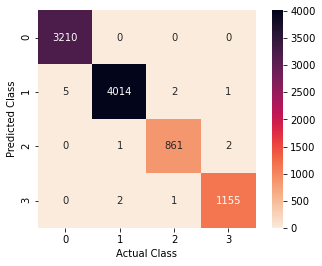

In [41]:
# load libraries
import seaborn as sns
from sklearn.metrics import confusion_matrix

# create confusion matrix (actual vs. pred)
mat = confusion_matrix(y_test, y_pred)

# plot as heatmap
sns.heatmap(mat.T, square=True, annot=True, fmt='d',
            cmap=sns.cm.rocket_r)
plt.xlabel('Actual Class')
plt.ylabel('Predicted Class')